# Imports and setup

In [2]:
import astropy.table as at
import astropy.units as u
import matplotlib as mpl
import matplotlib.pyplot as plt
import cmasher as cmr

%matplotlib inline
import numpy as np
import gala.coordinates as gc

from jax.config import config

config.update("jax_enable_x64", True)
import jax
import jax.numpy as jnp
import jaxopt

import arviz as az
import numpyro

from scipy.stats import binned_statistic
from scipy.interpolate import InterpolatedUnivariateSpline as IUS

numpyro.enable_x64()
numpyro.set_host_device_count(2)
#from numpyro_ext.optim import optimize

import sys
import importlib

## EDIT THESE IMPORTS BASED ON YOUR SETUP
sys.path.append('../../stream-membership')
sys.path.append('../')
sys.path.append('../../CATS_workshop/cats/')
from stream_membership import StreamMixtureModel
from stream_membership.plot import plot_data_projections
from gd1_helpers.membership.gd1_model import (
    Base,
    BackgroundModel,
    StreamDensModel,
    OffTrackModel,
)

In [3]:
cmap = plt.get_cmap('cmr.ember_r')
mpl.rc('image', cmap=cmap.name)
mpl.rc('image', cmap='gray_r')

In [4]:
cat = at.Table.read("../../CATS_Workshop/cats/data/joined-GD-1.fits")

cat['pm1'] = cat['pm_phi1_cosphi2_unrefl']
cat['pm2'] = cat['pm_phi2_unrefl']


stream='GD-1'
phi1_lim = (np.min(cat['phi1']), np.max(cat['phi1']))
phi1_lim = [-100,20]

cat = cat[(cat['phi1'] < phi1_lim[1]) & (cat['phi1'] > phi1_lim[0])] # clunky to hard code this

In [5]:
import pickle
with open('../data/gd1_pawprint.pkl', 'rb') as input_file:
    p = pickle.load(input_file)

with open('../data/gd1_run_data.pkl', 'rb') as input_file:
    run_data = pickle.load(input_file)

with open('../data/gd1_bkg_data.pkl', 'rb') as input_file:
    bkg_data = pickle.load(input_file)

with open('../data/gd1_stream_data.pkl', 'rb') as input_file:
    stream_data = pickle.load(input_file)

In [6]:
Base.setup(p, cat)

print(p)

{}


In [7]:
len(bkg_data['phi1'])

72315

In [8]:
Base.coord_bounds

{'phi1': (-99.99999968177843, 19.999977507814812),
 'phi2': (-7.970665258306633, 3.3488445561550395),
 'pm1': (-15.099955792705842, -4.636272829387963),
 'pm2': (-5.417437266355175, 1.929407661299365)}

# Background

In [17]:
BackgroundModel.bkg_update(pawprint=p, data=cat, knot_sep=10)

In [18]:
bkg_init_p = {
    "ln_N": np.log(len(bkg_data['phi1'])),
    #"phi1": {'zs': np.array([-3.5, -2.5, -1.5, -0.5, 0.5, 1.5, 2.5, 3.5])+1},
    "phi1": {'zs': np.zeros(BackgroundModel.phi1_locs.shape[0]-1)},
    "phi2": {},
    "pm1": {
        "w": np.full_like(BackgroundModel.pm1_knots, 0.5),
        "mean1": np.full_like(BackgroundModel.pm1_knots, 0),
        "ln_std1": np.full_like(BackgroundModel.pm1_knots, 1),
        "mean2": np.full_like(BackgroundModel.pm1_knots, 5),
        "ln_std2": np.full_like(BackgroundModel.pm1_knots, 2)
    },
    "pm2": {
        "w": np.full_like(BackgroundModel.pm2_knots, 0.5),
        "mean1": np.full_like(BackgroundModel.pm2_knots, -2.),
        "ln_std1": np.full_like(BackgroundModel.pm2_knots, 1),
        "mean2": np.full_like(BackgroundModel.pm2_knots, -3),
        "ln_std2": np.full_like(BackgroundModel.pm2_knots, 2)
    },
}

background_init = BackgroundModel(bkg_init_p)

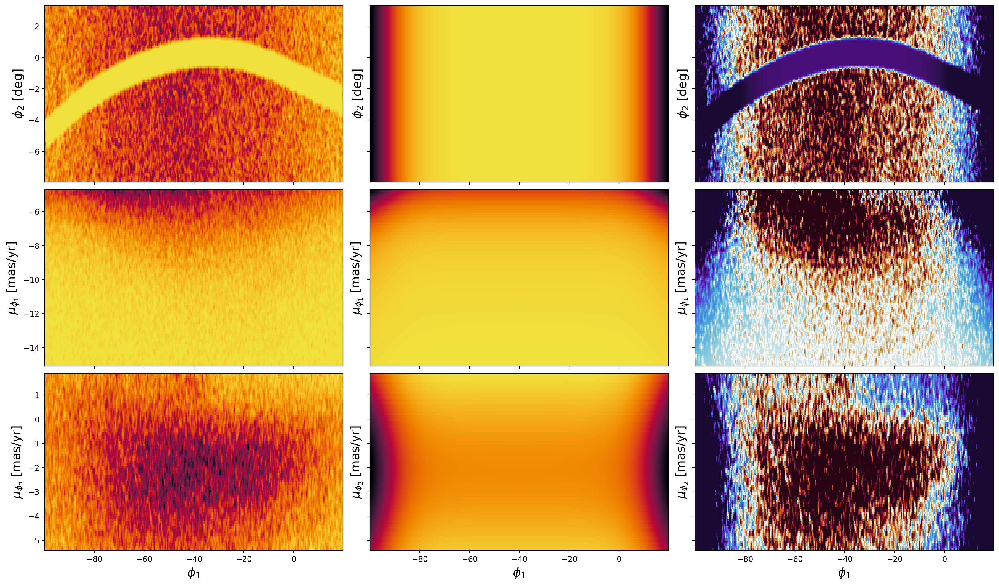

In [19]:
cmap = plt.get_cmap('cmr.ember_r')
mpl.rc('image', cmap=cmap.name)

fig, axes = plt.subplots(
    len(background_init.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(background_init.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=bkg_data,
    grids=background_init.default_grids,
    axes=axes[:, 0],
    # coord_names=GD1BackgroundModel.coord_names,
)
background_init.plot_model_projections(axes=axes[:, 1])
background_init.plot_residual_projections(
    data=bkg_data, axes=axes[:, 2], pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap=cmr.fusion)
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")

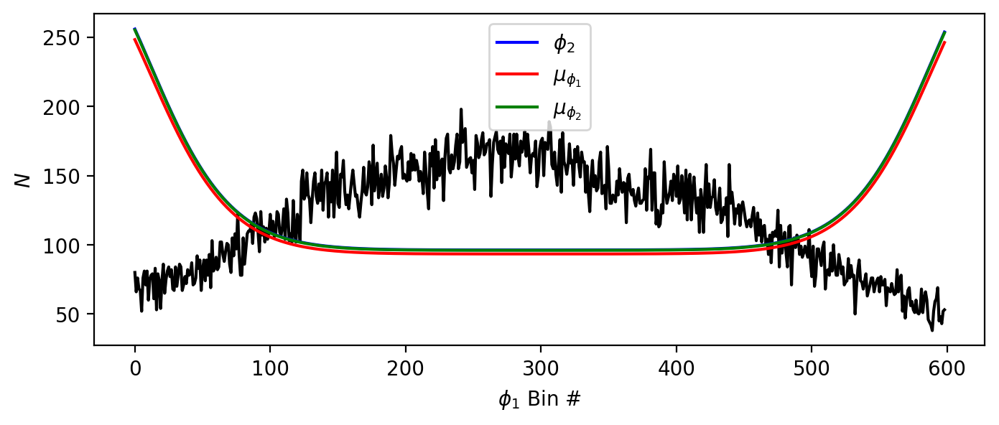

In [21]:
H_data1, *_ = np.histogram2d(
    bkg_data["phi1"],
    bkg_data["phi2"],
    bins=(background_init.default_grids["phi1"], background_init.default_grids['phi2'])
)

grids, ln_ns = background_init.evaluate_on_2d_grids()

fig, ax1 = plt.subplots(1,1,figsize=(8, 3))
ax1.plot(H_data1.sum(axis=1), c='k')
ax1.plot(np.exp(ln_ns[('phi1', 'phi2')]).sum(axis=0), c='b', label=r'$\phi_2$')
ax1.plot(np.exp(ln_ns[('phi1', 'pm1')]).sum(axis=0), c='r', label=r'$\mu_{\phi_1}$')
ax1.plot(np.exp(ln_ns[('phi1', 'pm2')]).sum(axis=0), c='g', label=r'$\mu_{\phi_2}$')
ax1.set_xlabel(r'$\phi_1$ Bin #')
ax1.set_ylabel(r'$N$')
ax1.legend()
plt.show()

In [22]:
def optimize(cls, data, init_params, jaxopt_kwargs=None, use_bounds=True, **kwargs):
    """
    A wrapper around numpyro_ext.optim utilities, which enable jaxopt optimization
    for numpyro models.
    """
    import jaxopt

    if jaxopt_kwargs is None:
        jaxopt_kwargs = {}
    jaxopt_kwargs.setdefault("maxiter", 1024)  # TODO: TOTALLY ARBITRARY

    optimize_kwargs = kwargs
    #jaxopt_kwargs.setdefault("method", "L-BFGS-B")
    optimize_kwargs["bounds"] = cls._get_jaxopt_bounds()
    optimize_kwargs["bounds"] = (
        cls._normalize_variable_keys(optimize_kwargs["bounds"][0]),
        cls._normalize_variable_keys(optimize_kwargs["bounds"][1]),
    )
    Optimizer = jaxopt.LBFGSB

    optimizer = Optimizer(**jaxopt_kwargs, fun=cls._objective)
    opt_res = optimizer.run(
        init_params=cls._normalize_variable_keys(init_params),
        data=cls._normalize_variable_keys(data),
        **optimize_kwargs,
    )
    return cls._expand_variable_keys(opt_res.params), opt_res.state

In [112]:
bkg_opt_pars, bkg_info = BackgroundModel.optimize(
    data=bkg_data,
    init_params=bkg_init_p,
    use_bounds=True,
    jaxopt_kwargs=dict(maxiter=4096),
)

# bkg_opt_pars, bkg_info = optimize(BackgroundModel,
#     data=bkg_data,
#     init_params=bkg_init_p,
#     use_bounds=True,
#     jaxopt_kwargs=dict(maxiter=4096),
# )


background_opt = BackgroundModel(bkg_opt_pars)
bkg_info

ScipyMinimizeInfo(fun_val=Array(0.70687385, dtype=float64, weak_type=True), success=True, status=0, iter_num=2311, hess_inv=LbfgsInvHessProduct(sk=[[-9.70454099e-05 -7.73002929e-04  1.84828259e-04 ... -4.12554898e-04
  -1.36502480e-04  3.11293783e-04]
 [ 1.63159718e-05 -5.31264686e-06 -7.95254572e-06 ... -1.15524599e-04
  -6.38519435e-05  1.43438109e-05]
 [ 4.30507809e-05 -1.61703141e-04  1.92908187e-05 ... -1.57167213e-04
  -1.01401958e-04 -1.39556787e-05]
 ...
 [ 4.07478476e-05 -1.41504815e-03  4.55134820e-04 ... -7.46260743e-04
   4.09341876e-04 -9.80566509e-04]
 [-1.51925404e-04 -1.57414690e-03  5.11414104e-04 ... -6.43881341e-04
   4.87259279e-04 -7.56573257e-04]
 [ 6.13892891e-05  6.57445899e-04 -1.92885716e-04 ...  1.25471468e-04
  -1.68012427e-04  2.51488495e-04]], yk=[[-9.70464126e-05 -1.32486051e-07  1.56697013e-07 ... -6.92516192e-06
  -3.17658508e-06  3.31984970e-06]
 [ 1.63154818e-05  9.34825673e-09  1.80680099e-08 ... -6.55763635e-06
  -3.91721339e-06 -5.30489750e-07]
 [ 

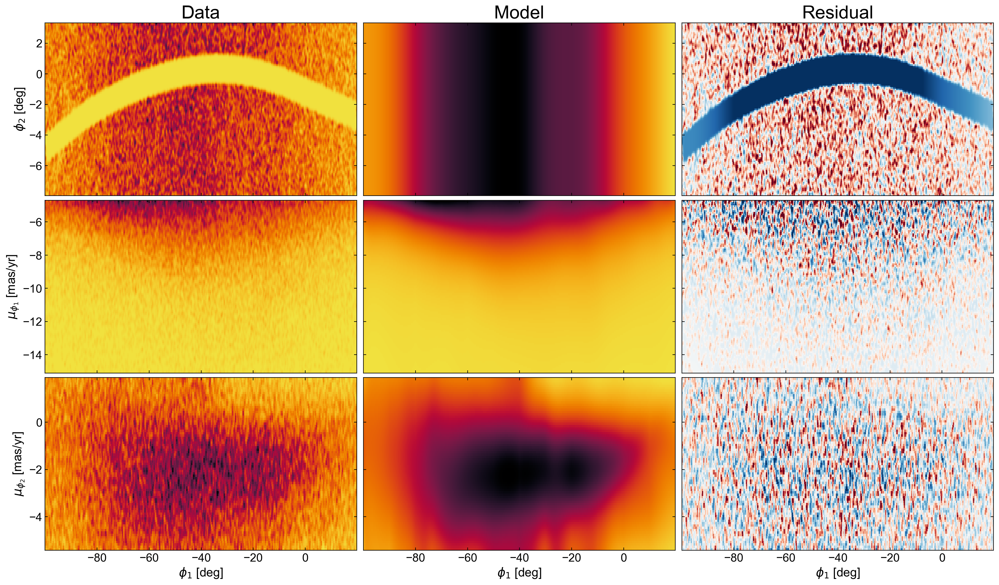

In [154]:
fig, axes = plt.subplots(
    len(background_opt.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(background_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=bkg_data,
    grids=BackgroundModel.default_grids,
    axes=axes[:, 0],
    # coord_names=GD1BackgroundModel.coord_names,
)
background_opt.plot_model_projections(axes=axes[:, 1], label=False)
background_opt.plot_residual_projections(
    data=bkg_data, axes=axes[:, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu')
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()
fig.savefig('../paper_figures/background_model.pdf')

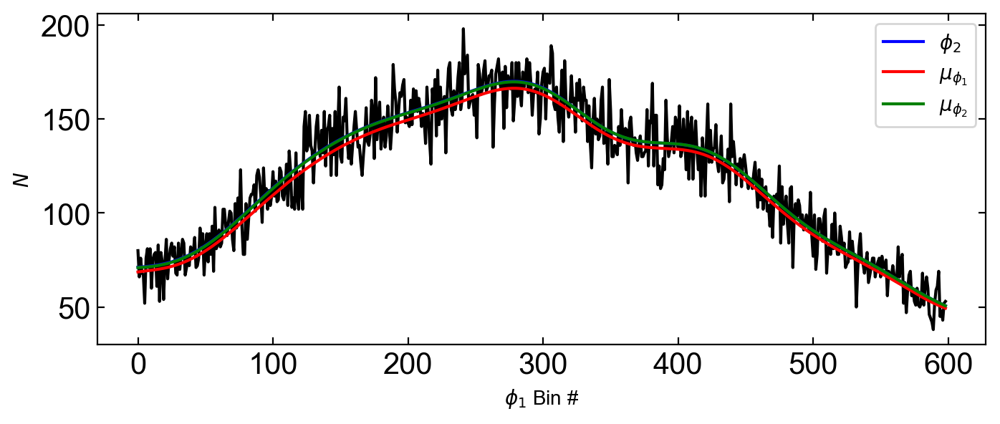

In [141]:
H_data1, *_ = np.histogram2d(
    bkg_data["phi1"],
    bkg_data["phi2"],
    bins=(background_opt.default_grids["phi1"], background_opt.default_grids['phi2'])
)

grids, ln_ns = background_opt.evaluate_on_2d_grids()

fig, ax1 = plt.subplots(1,1,figsize=(8, 3))
ax1.plot(H_data1.sum(axis=1), c='k')
ax1.plot(np.exp(ln_ns[('phi1', 'phi2')]).sum(axis=0), c='b', label=r'$\phi_2$')
ax1.plot(np.exp(ln_ns[('phi1', 'pm1')]).sum(axis=0), c='r', label=r'$\mu_{\phi_1}$')
ax1.plot(np.exp(ln_ns[('phi1', 'pm2')]).sum(axis=0), c='g', label=r'$\mu_{\phi_2}$')
ax1.set_xlabel(r'$\phi_1$ Bin #')
ax1.set_ylabel(r'$N$')
ax1.legend()
plt.show()

# Stream

In [9]:
StreamDensModel.stream_dens_update(pawprint=p, data=cat, knot_sep=5)

In [10]:
from scipy.stats import binned_statistic
from scipy.interpolate import InterpolatedUnivariateSpline

_phi2_stat = binned_statistic(stream_data["phi1"], stream_data["phi2"], bins=np.linspace(phi1_lim[0], phi1_lim[1], 21))
_phi2_interp = IUS(
    0.5 * (_phi2_stat.bin_edges[:-1] + _phi2_stat.bin_edges[1:]), _phi2_stat.statistic, ext=0, k=1
)

_pm1_stat = binned_statistic(stream_data["phi1"], stream_data["pm1"], bins=np.linspace(phi1_lim[0], phi1_lim[1], 32))
_pm1_interp = IUS(
    0.5 * (_pm1_stat.bin_edges[:-1] + _pm1_stat.bin_edges[1:]), _pm1_stat.statistic, ext=0, k=1
)

_pm2_stat = binned_statistic(stream_data["phi1"], stream_data["pm2"], bins=np.linspace(phi1_lim[0], phi1_lim[1], 32))
_pm2_interp = IUS(
    0.5 * (_pm2_stat.bin_edges[:-1] + _pm2_stat.bin_edges[1:]), _pm2_stat.statistic, ext=0, k=1
)

In [11]:
stream_init_p = {
    "ln_N": np.log(len(stream_data['phi1'])),
    "phi1": {
        "zs": np.zeros(StreamDensModel.phi1_locs.shape[0]-1)
    },
    "phi2": {
        "mean": _phi2_interp(StreamDensModel.phi2_knots),
        "ln_std": np.full_like(StreamDensModel.phi2_knots, 0)
    },
    "pm1": {
        "mean": _pm1_interp(StreamDensModel.pm1_knots),
        "ln_std": np.full_like(StreamDensModel.pm1_knots, -0.5)
    },
    "pm2": {
        "mean": _pm2_interp(StreamDensModel.pm2_knots),
        "ln_std": np.full_like(StreamDensModel.pm2_knots, -0.5)
    }
}

{'phi1': Array([-3.91110207, -3.93289625, -3.95557051, ..., -3.97904223,
       -3.95556428, -3.9328899 ], dtype=float64), 'phi2': Array([ -5.57770883,  -5.67372963,  -5.76854449, ..., -17.51033729,
       -17.58555758, -17.6612286 ], dtype=float64), 'pm1': Array([-62.37761217, -62.88277674, -63.38513291, ..., -90.01673751,
       -89.94756517, -89.86510109], dtype=float64), 'pm2': Array([-0.88111501, -0.75584877, -0.65285691, ..., -6.01313804,
       -6.35448198, -6.73476443], dtype=float64)}
{'phi1': Array([-3.91110207, -3.93289625, -3.95557051, ..., -3.97904223,
       -3.95556428, -3.9328899 ], dtype=float64), 'phi2': Array([-12.76613861, -12.61454458, -12.46726849, ...,  -3.99690785,
        -4.02935483,  -4.06209352], dtype=float64), 'pm1': Array([-94.00827482, -93.38978385, -92.77921524, ..., -15.84818908,
       -15.81949198, -15.78530106], dtype=float64), 'pm2': Array([-0.88111501, -0.75584877, -0.65285691, ..., -6.01313804,
       -6.35448198, -6.73476443], dtype=float64)}
{'

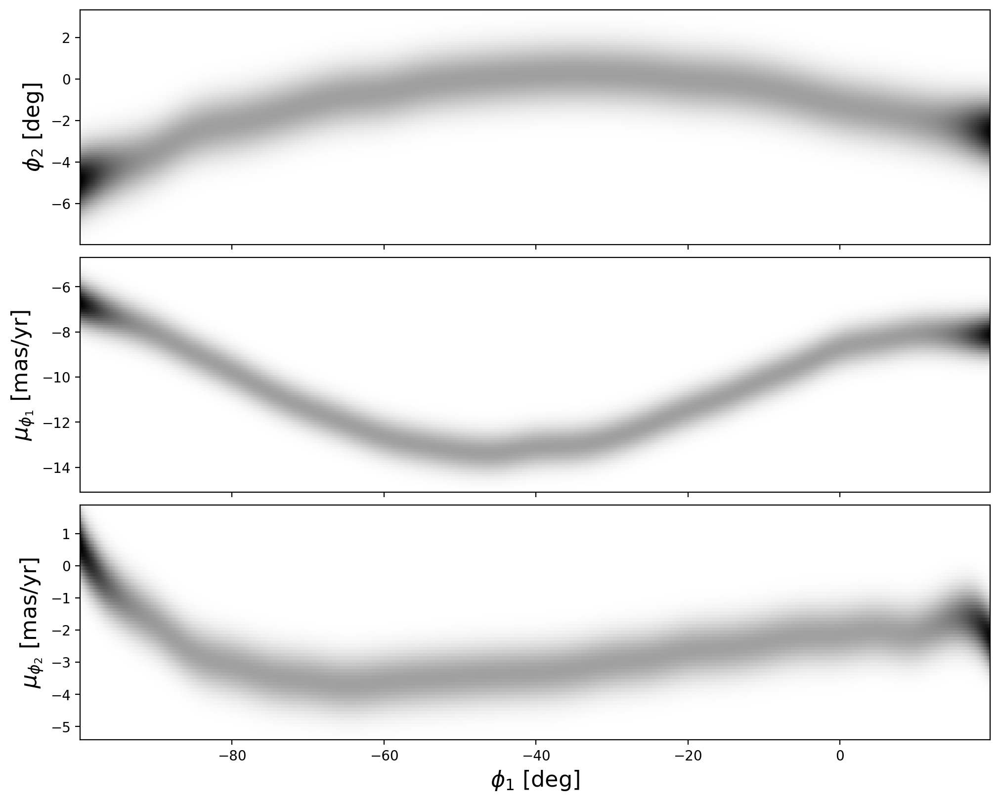

In [12]:
stream_init = StreamDensModel(stream_init_p)
_ = stream_init.plot_model_projections()

{'phi1': Array([-3.91110207, -3.93289625, -3.95557051, ..., -3.97904223,
       -3.95556428, -3.9328899 ], dtype=float64), 'phi2': Array([ -5.57770883,  -5.67372963,  -5.76854449, ..., -17.51033729,
       -17.58555758, -17.6612286 ], dtype=float64), 'pm1': Array([-62.37761217, -62.88277674, -63.38513291, ..., -90.01673751,
       -89.94756517, -89.86510109], dtype=float64), 'pm2': Array([-0.88111501, -0.75584877, -0.65285691, ..., -6.01313804,
       -6.35448198, -6.73476443], dtype=float64)}
{'phi1': Array([-3.91110207, -3.93289625, -3.95557051, ..., -3.97904223,
       -3.95556428, -3.9328899 ], dtype=float64), 'phi2': Array([-12.76613861, -12.61454458, -12.46726849, ...,  -3.99690785,
        -4.02935483,  -4.06209352], dtype=float64), 'pm1': Array([-94.00827482, -93.38978385, -92.77921524, ..., -15.84818908,
       -15.81949198, -15.78530106], dtype=float64), 'pm2': Array([-0.88111501, -0.75584877, -0.65285691, ..., -6.01313804,
       -6.35448198, -6.73476443], dtype=float64)}
{'

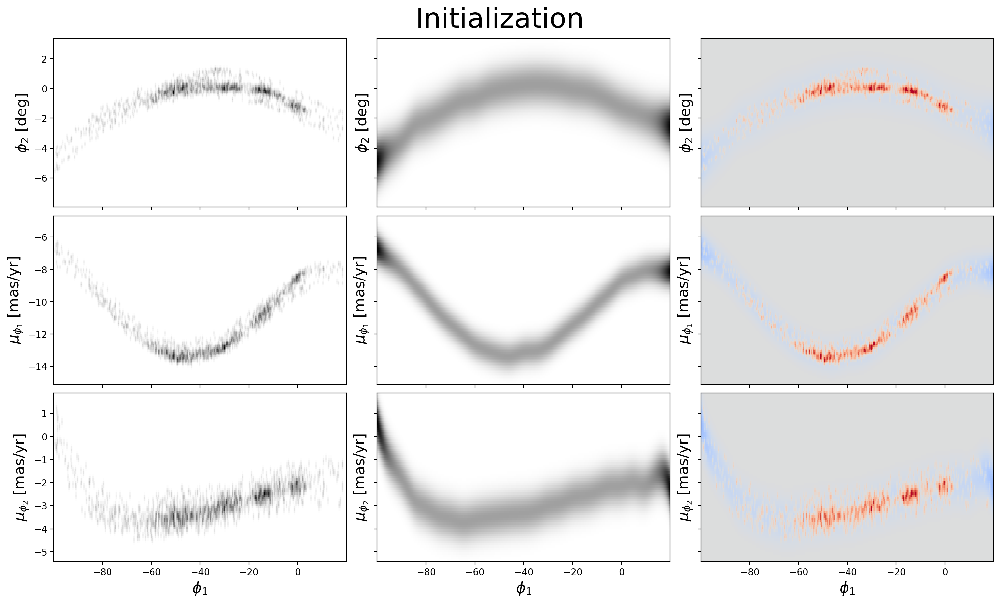

In [13]:
fig, axes = plt.subplots(
    len(stream_init.coord_names) - 1,
    3,
    figsize=(15, 3 * (len(stream_init.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=stream_data,
    grids=stream_init.default_grids,
    axes=axes[:, 0],
    # coord_names=GD1BackgroundModel.coord_names,
)
stream_init.plot_model_projections(axes=axes[:, 1])
stream_init.plot_residual_projections(
    data=stream_data, axes=axes[:, 2], pcolormesh_kwargs=dict(vmin=-1, vmax=1)
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")
fig.suptitle('Initialization', fontsize=30)
plt.show()

In [148]:
stream_opt_pars, info = StreamDensModel.optimize(
    data=stream_data, init_params=stream_init_p, use_bounds=True
)

# stream_opt_pars, info = optimize(StreamDensModel,
#     data=stream_data, init_params=stream_init_p, use_bounds=True
# )

stream_opt = StreamDensModel(stream_opt_pars)
info

ScipyMinimizeInfo(fun_val=Array(-0.64934252, dtype=float64, weak_type=True), success=True, status=0, iter_num=597, hess_inv=LbfgsInvHessProduct(sk=[[-1.26567623e-05 -1.55882575e-03  2.41344559e-04 ... -1.97479014e-05
   1.42937416e-05 -4.25831745e-05]
 [-1.18628197e-05 -2.03420713e-03  2.75446638e-04 ... -5.34670063e-05
   3.07245785e-05 -4.25036415e-05]
 [-1.01992879e-05 -1.13614179e-03  1.35628592e-04 ... -9.80592329e-06
  -5.31478895e-06 -2.07540655e-05]
 ...
 [ 3.75306368e-05 -3.88266982e-04  8.98530694e-05 ... -2.70679582e-05
   3.57150601e-05 -3.52421706e-05]
 [ 2.99192879e-06 -1.20879175e-03  2.17155938e-04 ... -3.61193487e-05
   4.04571470e-05 -5.05814459e-05]
 [-5.84175713e-07 -3.09715639e-03  4.72748502e-04 ... -9.45028317e-05
   7.79535997e-05 -8.40251056e-05]], yk=[[-1.26570051e-05  2.98025174e-08  2.60954982e-07 ... -7.02390015e-07
   4.69193926e-07 -1.59700301e-07]
 [-1.18629019e-05  1.27337332e-08  4.21598316e-08 ... -2.11764865e-06
   1.16720050e-06 -9.84390063e-08]
 [-

Text(0, 0.5, '$\\phi_2$')

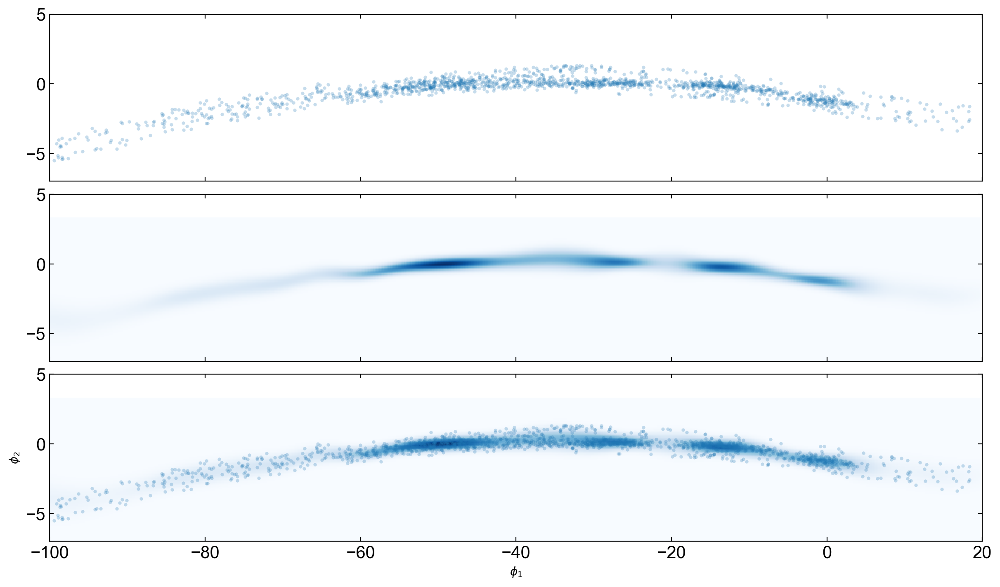

In [149]:
# _grids, ln_dens = GD1StreamModel(stream_init_p).evaluate_on_2d_grids()
_grids, ln_dens = stream_opt.evaluate_on_2d_grids()

fig, axes = plt.subplots(3, 1, figsize=(12, 7), constrained_layout=True, sharex=True, sharey=True)

for ax in [axes[0], axes[2]]:
    ax.plot(
        stream_data['phi1'],
        stream_data['phi2'],
        marker="o",
        markeredgewidth=0,
        markersize=3.0,
        ls="none",
        alpha=0.25,
    )
    
for ax in [axes[1], axes[2]]:
    ax.pcolormesh(
        _grids[('phi1', 'phi2')][0],
        _grids[('phi1', 'phi2')][1],
        np.exp(ln_dens[('phi1', 'phi2')]),
        cmap="Blues",
        shading='auto'
    )
ax.set_xlim(-100, 20)
ax.set_ylim(-7, 5)

ax.set_xlabel(r"$\phi_1$")
ax.set_ylabel(r"$\phi_2$")

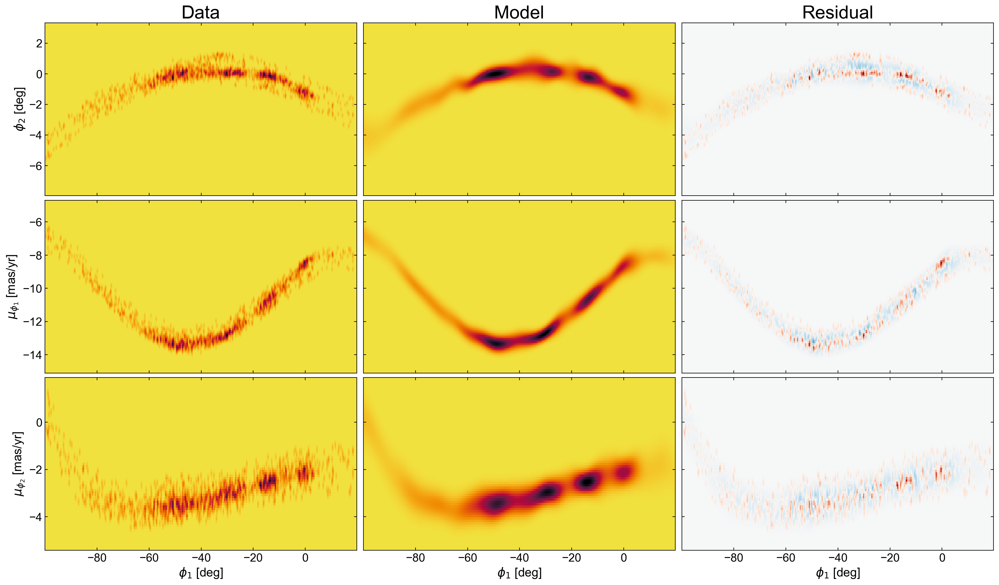

In [158]:
fig, axes = plt.subplots(
    len(background_opt.coord_names) - 1,
    3, 
    figsize=(18, 3.5 * (len(stream_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=stream_data,
    grids=Base.default_grids,
    axes=axes[:, 0],
)
stream_opt.plot_model_projections(axes=axes[:, 1], label=False)
stream_opt.plot_residual_projections(
    data=stream_data, axes=axes[:, 2], label=False,
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu')
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()
fig.savefig('../paper_figures/stream_model.pdf')

# Mixture of Stream + Background (no off-track)

In [159]:
Components = [StreamDensModel, BackgroundModel]
mix_params0 = {"stream": stream_opt_pars, "background": bkg_opt_pars}
mix_params0['background']['ln_N'] = np.log(len(run_data['phi1']) - np.exp(mix_params0['stream']['ln_N']))

In [160]:
mix_init = StreamMixtureModel(mix_params0, Components)

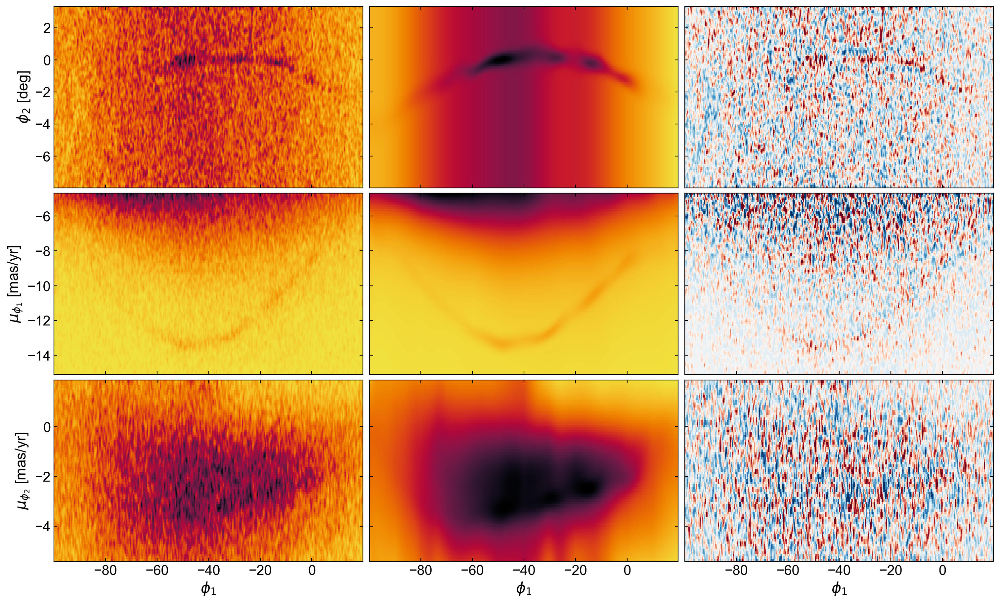

In [161]:
fig, axes = plt.subplots(
    len(stream_opt.coord_names) - 1,
    3, 
    figsize=(15, 3 * (len(stream_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=Base.default_grids,
    axes=axes[:, 0],
)
mix_init.plot_model_projections(axes=axes[:, 1], label=False)
mix_init.plot_residual_projections(
    data=run_data, axes=axes[:, 2], label=False,
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu')
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")

In [41]:
from functools import partial

def optimize_mixture(cls, data, init_params, Components, jaxopt_kwargs=None, use_bounds=True, **kwargs):
    """
    A wrapper around numpyro_ext.optim utilities, which enable jaxopt optimization
    for numpyro models.
    """
    import jaxopt

    if jaxopt_kwargs is None:
        jaxopt_kwargs = {}
    jaxopt_kwargs.setdefault("maxiter", 1024)  # TODO: TOTALLY ARBITRARY

    tied_params = kwargs.pop('tied_params', None)
    
    optimize_kwargs = kwargs
    #jaxopt_kwargs.setdefault("method", "L-BFGS-B")
    optimize_kwargs["bounds"] = cls._get_jaxopt_bounds(Components, tied_params)
    # optimize_kwargs["bounds"] = (
    #     cls._normalize_variable_keys(optimize_kwargs["bounds"][0]),
    #     cls._normalize_variable_keys(optimize_kwargs["bounds"][1]),
    # )
    Optimizer = jaxopt.LBFGSB

    optimizer = Optimizer(**jaxopt_kwargs, fun=partial(cls._objective, 
                                                      Components=Components,
                                                      tied_params=tied_params))
    opt_res = optimizer.run(
        init_params={C.name: C._normalize_variable_keys(init_params[C.name])
                     for C in Components},
        data=Components[0]._normalize_variable_keys(data),
        **optimize_kwargs,
    )
    opt_p = {
            C.name: C._expand_variable_keys(opt_res.params[C.name]) for C in Components
        }
    return opt_p, opt_res.state

There needs to be a way to run the optimization with your choice of optimizer (e.g. ScipyBoundedMinimize vs LBFGSB vs Nelder-Mead ...)

In [162]:
mix_opt_pars, info = StreamMixtureModel.optimize(
    data=run_data, Components=Components, init_params=mix_params0, use_bounds=True,
    jaxopt_kwargs=dict(maxiter=1024)
)

# mix_opt_pars, info = optimize_mixture(StreamMixtureModel, data=run_data,
#                                       init_params=mix_params0, Components=Components,
#                                       use_bounds=True)

mix_opt = StreamMixtureModel(mix_opt_pars, Components=Components)
info

ScipyMinimizeInfo(fun_val=Array(0.48679616, dtype=float64, weak_type=True), success=True, status=0, iter_num=801, hess_inv=LbfgsInvHessProduct(sk=[[-6.88824416e-05  5.72666882e-06  3.18248797e-05 ...  1.80391267e-04
  -5.14616930e-04 -8.98935925e-04]
 [-2.43445988e-05  2.67355818e-07  2.69426490e-06 ... -6.80233862e-05
   1.60341818e-04  3.48672081e-04]
 [-4.18362534e-05  3.91171296e-06 -4.17051726e-05 ...  3.06234716e-05
  -3.86839578e-05  8.03835964e-04]
 ...
 [ 6.98791441e-05  2.17474466e-05 -4.63227503e-05 ...  2.46542137e-05
  -1.28662895e-04  9.84881710e-04]
 [-1.39479714e-04  4.07742291e-05 -1.45947462e-04 ...  1.66401719e-04
  -2.91669911e-04  3.02958507e-03]
 [ 1.85208754e-05  1.72528528e-05  1.78263870e-05 ...  2.10240079e-06
  -1.51724917e-05  8.62378498e-04]], yk=[[-6.66906935e-05  5.18160020e-07  5.39161051e-06 ...  3.79256016e-07
  -4.36071962e-07 -3.71031054e-08]
 [-2.41003514e-05 -1.36142648e-07 -1.36491281e-06 ... -1.74005317e-07
   1.30016121e-07  1.54749386e-08]
 [-4

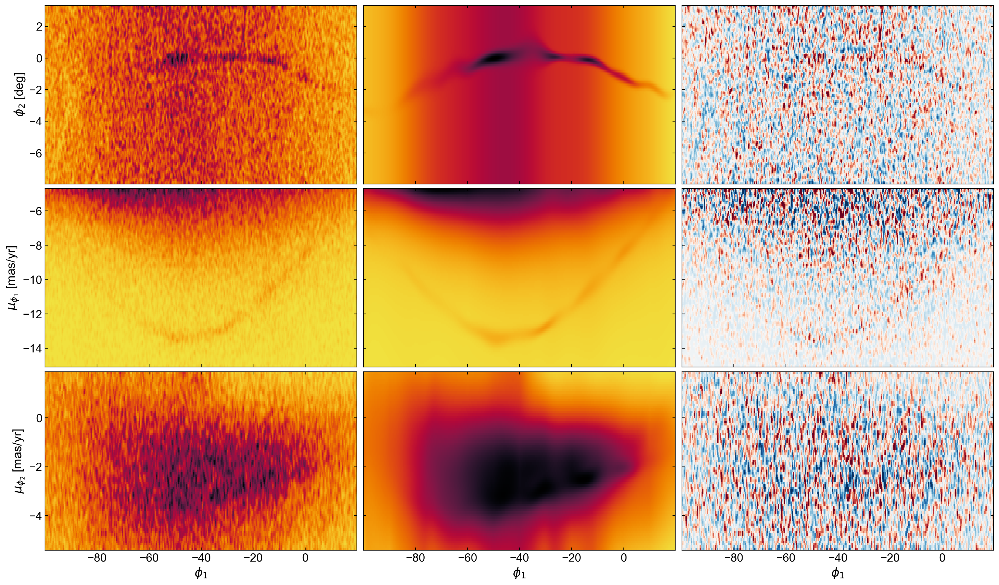

In [163]:
fig, axes = plt.subplots(
    len(stream_opt.coord_names) - 1,
    3, 
    figsize=(18, 3.5 * (len(stream_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=Base.default_grids,
    axes=axes[:, 0],
)
mix_opt.plot_model_projections(axes=axes[:, 1], label=False)
mix_opt.plot_residual_projections(
    data=run_data, axes=axes[:, 2], label=False,
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu')
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")

In [44]:
stream_comp, bkg_comp = mix_opt.components[0], mix_opt.components[1]
stream_ll = -np.log(stream_comp.get_N()) + stream_comp.ln_number_density(run_data)
bkg_ll = -np.log(bkg_comp.get_N()) + bkg_comp.ln_number_density(run_data)
print(stream_ll.sum(), bkg_ll.sum())

-inf -977767.6940153923


I think what I've done here is show that there is a typo in stream-membership. I think that in the ln-Likelihood function, it should be np.log(N) instead of just N (or the equivalent, since the syntax is slightly different in different functions).

(array([8.000e+00, 8.000e+00, 1.900e+01, 1.200e+01, 3.100e+01, 4.200e+01,
        5.100e+01, 5.400e+01, 6.100e+01, 7.200e+01, 6.800e+01, 7.800e+01,
        8.900e+01, 8.300e+01, 9.700e+01, 1.010e+02, 1.210e+02, 1.180e+02,
        1.560e+02, 1.420e+02, 1.630e+02, 2.150e+02, 2.290e+02, 2.790e+02,
        3.690e+02, 5.000e+02, 7.330e+02, 1.044e+03, 1.368e+03, 1.527e+03,
        1.786e+03, 2.049e+03, 2.215e+03, 2.475e+03, 2.994e+03, 3.582e+03,
        4.245e+03, 4.702e+03, 5.165e+03, 5.650e+03, 6.580e+03, 7.627e+03,
        8.079e+03, 8.028e+03, 7.095e+03, 5.305e+03, 4.021e+03, 0.000e+00,
        0.000e+00, 0.000e+00]),
 array([-1500., -1468., -1436., -1404., -1372., -1340., -1308., -1276.,
        -1244., -1212., -1180., -1148., -1116., -1084., -1052., -1020.,
         -988.,  -956.,  -924.,  -892.,  -860.,  -828.,  -796.,  -764.,
         -732.,  -700.,  -668.,  -636.,  -604.,  -572.,  -540.,  -508.,
         -476.,  -444.,  -412.,  -380.,  -348.,  -316.,  -284.,  -252.,
         -220., 

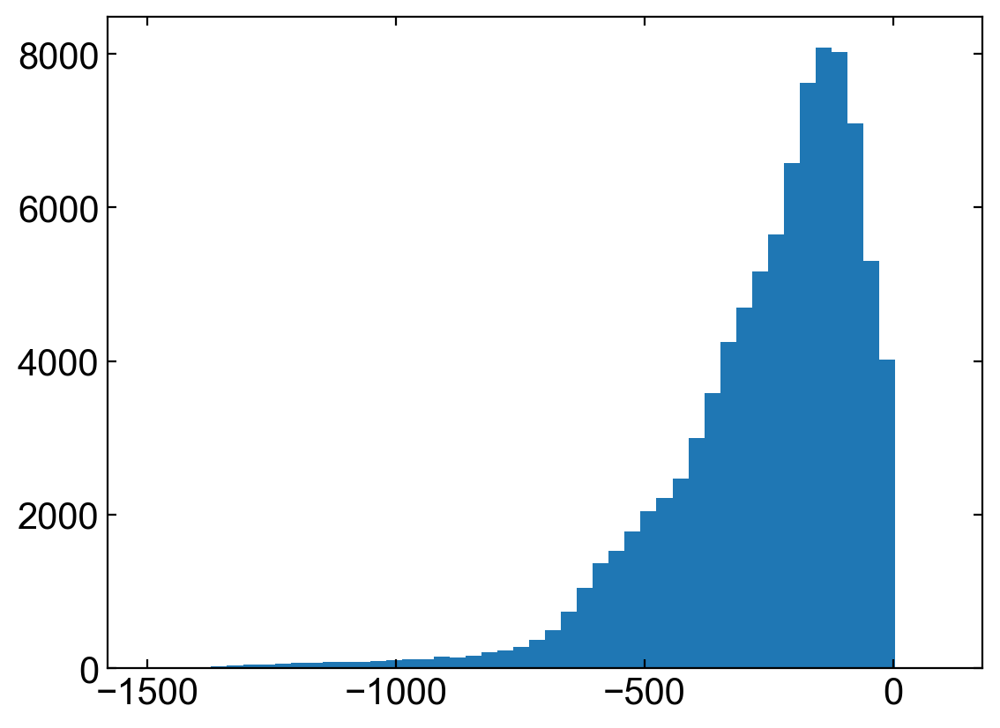

In [45]:
plt.hist(stream_ll, bins=50, range=[-1500,100])

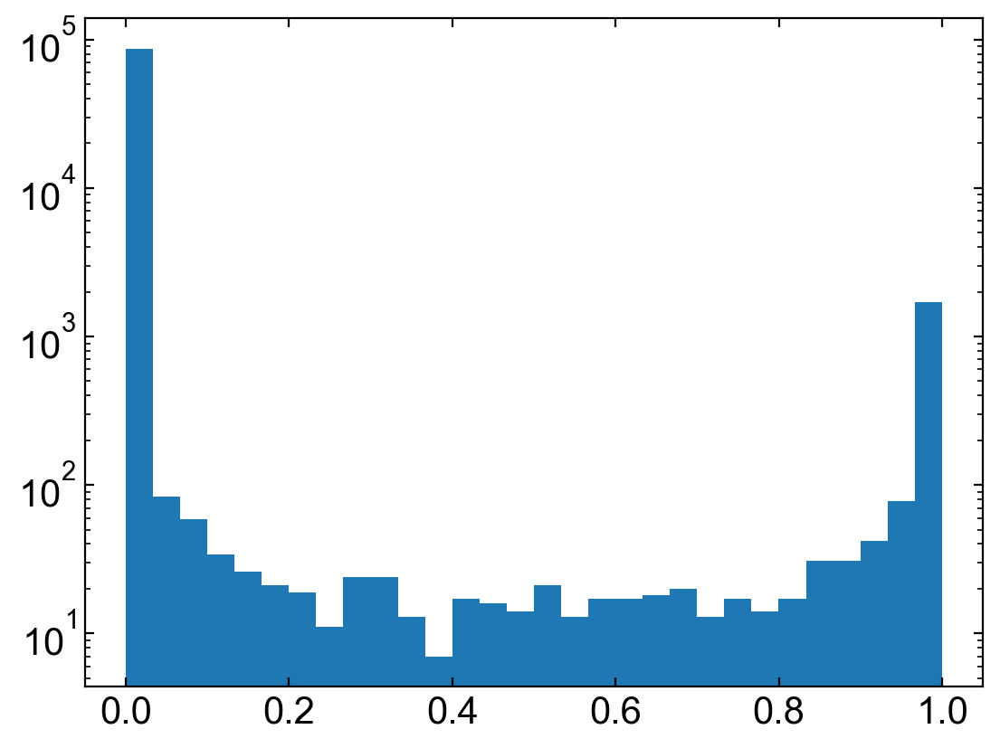

In [46]:
memb_prob = np.exp(stream_ll - np.logaddexp(stream_ll,bkg_ll))
plt.hist(memb_prob, bins=30)
plt.yscale('log')

In [47]:
(memb_prob > 0.5).sum()

2062

Text(0, 0.5, '$\\phi_2$')

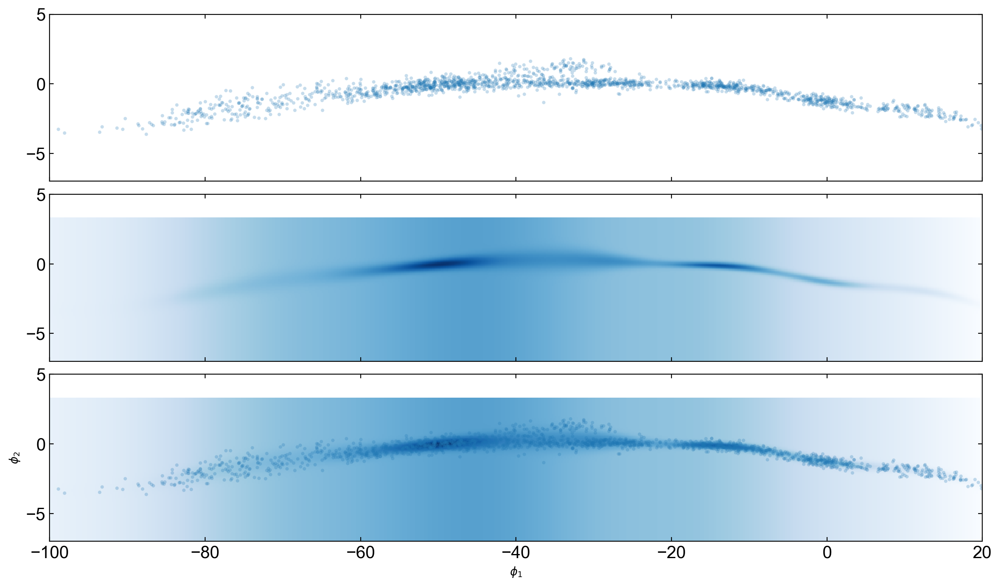

In [48]:
_grids, ln_dens = mix_opt.evaluate_on_2d_grids()

fig, axes = plt.subplots(3, 1, figsize=(12, 7), constrained_layout=True, sharex=True, sharey=True)
for ax in [axes[0], axes[2]]:
    ax.plot(
        run_data['phi1'][memb_prob>0.9],
        run_data['phi2'][memb_prob>0.9],
        marker="o",
        markeredgewidth=0,
        markersize=3.0,
        ls="none",
        alpha=0.25,
    )
    
for ax in [axes[1], axes[2]]:
    ax.pcolormesh(
        _grids[('phi1', 'phi2')][0],
        _grids[('phi1', 'phi2')][1],
        np.exp(ln_dens[('phi1', 'phi2')]),
        cmap="Blues",
        shading='auto'
    )
ax.set_xlim(-100, 20)
ax.set_ylim(-7, 5)

ax.set_xlabel(r"$\phi_1$")
ax.set_ylabel(r"$\phi_2$")

# Off-track

In [49]:
OffTrackModel.offtrack_update(p, cat, dens_steps=np.array([4,0.4]))

In [50]:
offtrack_init_p = {
    "ln_N": np.log(90),
    ("phi1", "phi2"): {
        "zs": np.zeros(OffTrackModel.phi12_locs.shape[0] - 1)
    },
    "pm1": stream_opt_pars["pm1"].copy(),
    "pm2": stream_opt_pars["pm2"].copy()
}

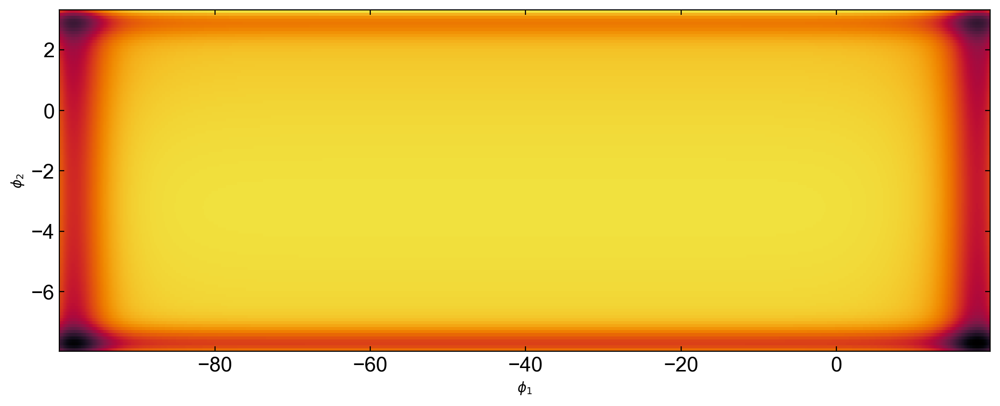

In [51]:
offtrack_model0 = OffTrackModel(offtrack_init_p)
_ = offtrack_model0.plot_model_projections(grid_coord_names=[('phi1', 'phi2')])

In [89]:
offtrack_model0.phi12_locs

array([[-9.99999997e+01, -7.97066526e+00],
       [-9.99999997e+01, -7.57066526e+00],
       [-9.99999997e+01, -7.17066526e+00],
       ...,
       [ 2.80000003e+01,  2.93347417e-02],
       [ 2.80000003e+01,  4.02933474e+00],
       [ 2.80000003e+01,  8.02933474e+00]])

# Mixture of all components

In [52]:
full_Components = [StreamDensModel, BackgroundModel, OffTrackModel]
full_mix_params0 = {
    "stream": mix_opt_pars['stream'],
    "background": mix_opt_pars['background'],
    "offtrack": offtrack_init_p,
}

In [53]:
tied_params = [
    (("offtrack", "pm1"), ("stream", "pm1")),
    (("offtrack", "pm2"), ("stream", "pm2")),
]
full_mix_init = StreamMixtureModel(
    full_mix_params0, full_Components, tied_params=tied_params
)

In [55]:
full_mix_opt_pars, info = StreamMixtureModel.optimize(
    data=run_data,
    Components=full_Components,
    #tied_params=tied_params,
    init_params=full_mix_params0,
    use_bounds=True,
)

# full_mix_opt_pars, info = optimize_mixture(StreamMixtureModel, data=run_data,
#                                       init_params=full_mix_params0, Components=full_Components,
#                                       use_bounds=True)

full_mix_opt = StreamMixtureModel(full_mix_opt_pars, Components=full_Components)
info

ScipyMinimizeInfo(fun_val=Array(0.48390216, dtype=float64, weak_type=True), success=True, status=0, iter_num=4124, hess_inv=LbfgsInvHessProduct(sk=[[ 2.11933582e-05 -1.80578487e-05 -9.12473941e-07 ...  2.25888528e-05
  -1.05898170e-05 -1.39817992e-04]
 [ 6.08067056e-05 -1.87505972e-05  2.73687992e-05 ...  4.30756152e-05
  -2.45996697e-05 -1.94310812e-04]
 [-5.75306347e-05 -2.19097147e-05 -4.12366241e-05 ...  7.25149585e-05
  -6.83626590e-06 -1.35877097e-04]
 ...
 [-9.27106444e-05  1.31031308e-06  6.11961777e-05 ... -3.90861849e-05
  -1.01668704e-05 -6.77201062e-05]
 [ 2.37883129e-05  3.58709331e-06  6.62215922e-05 ... -2.90272037e-05
  -1.66486494e-05 -4.28558952e-05]
 [ 6.39375208e-05 -8.39498705e-06  1.01425812e-04 ... -3.00490455e-05
  -3.38625668e-05 -1.66981484e-04]], yk=[[ 2.08683895e-05  8.57912491e-08  8.17313402e-07 ...  4.91688287e-07
  -8.32567664e-08 -4.05751280e-08]
 [ 5.97400506e-05  1.21917457e-07  9.36588757e-07 ...  8.86487087e-07
  -2.16049168e-07 -5.85043125e-08]
 [-

In [165]:
import pickle

In [166]:
with open('../data/full_model_opt_params.pkl', 'wb') as output_file2:
    pickle.dump(full_mix_opt_pars, output_file2)

NameError: name 'full_mix_opt_pars' is not defined

In [172]:
# with open('../data/full_model_optimization.pkl', 'rb') as input_file:
#     testing1 = pickle.load(input_file)

with open('../data/full_model_opt_params_small_sep.pkl', 'rb') as input_file:
    full_mix_opt_pars = pickle.load(input_file)

In [47]:
# if optimization fails, run again with initialization from the end of the last run

# full_mix_params1 = full_mix_opt_pars

# full_mix_opt_pars1, info1 = StreamMixtureModel.optimize(
#     data=run_data,
#     Components=full_Components,
#     #tied_params=tied_params,
#     init_params=full_mix_params1,
#     use_bounds=True,
# )
# full_mix_opt1 = StreamMixtureModel(full_mix_opt_pars1, Components=full_Components)
# info1

In [174]:
import copy
tmp_pars = copy.deepcopy(full_mix_opt_pars['offtrack'])
tmp_pars['pm1'] = full_mix_opt_pars['stream']['pm1'].copy()
tmp_pars['pm2'] = full_mix_opt_pars['stream']['pm2'].copy()
tmp = OffTrackModel(tmp_pars)
tmp.plot_model_projections(
    grid_coord_names=[("phi1", "phi2")], label=False, 
    pcolormesh_kwargs=dict(vmin=0, vmax=1, cmap='cmr.ember_r')
)

ValueError: No default grid for phi1, so you must specify it via the `grids` argument

(<Figure size 1000x400 with 1 Axes>,
 array([<Axes: xlabel='$\\phi_1$', ylabel='$\\phi_2$'>], dtype=object))

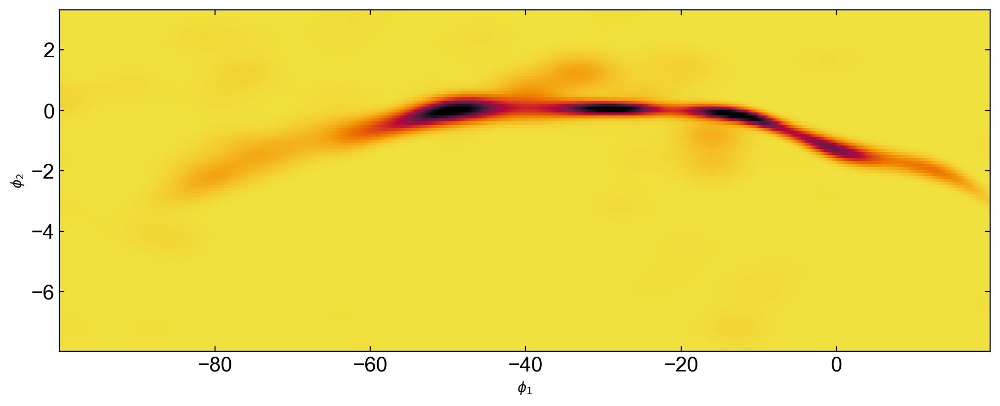

In [76]:
full_mix_nobkg_opt = StreamMixtureModel(
    full_mix_opt_pars, Components=[StreamDensModel, OffTrackModel], tied_params=tied_params
)
full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "phi2")], pcolormesh_kwargs=dict(vmin=0, vmax=1, cmap='cmr.ember_r')
)

In [52]:
full_mix_opt.components

In [62]:
stream_comp, bkg_comp, offtrack_comp = full_mix_opt.components[0], full_mix_opt.components[1], full_mix_opt.components[2]
stream_ll = -np.log(stream_comp.get_N()) + stream_comp.ln_number_density(run_data)
bkg_ll = -np.log(bkg_comp.get_N()) + bkg_comp.ln_number_density(run_data)
offtrack_ll = -np.log(offtrack_comp.get_N()) + offtrack_comp.ln_number_density(run_data)

#one way
fg_ll = np.logaddexp(stream_ll, offtrack_ll)

#another way
# fg_comps = full_mix_nobkg_opt.components
# fg_ll_ = -np.log(fg_comps[0].get_N() + fg_comps[1].get_N()) + full_mix_nobkg_opt.ln_number_density(run_data)

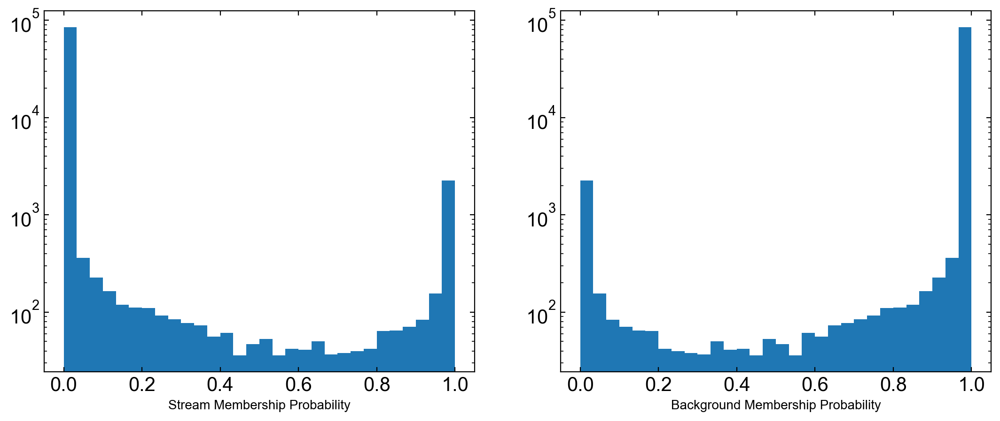

In [63]:
final_memb_prob = np.exp(fg_ll - np.logaddexp(fg_ll,bkg_ll)) #update for offtrack included
bkg_prob = np.exp(bkg_ll - np.logaddexp(fg_ll,bkg_ll))

fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(13, 5))
ax1.hist(final_memb_prob, bins=30)
ax1.set_yscale('log')
ax1.set_xlabel('Stream Membership Probability')

ax2.hist(bkg_prob, bins=30)
ax2.set_xlabel('Background Membership Probability')
ax2.set_yscale('log')
plt.show()

In [78]:
(final_memb_prob > 0.99).sum()

1951

In [66]:
# for the plotting, but takes a minute, so have it in a differnet cell
_grids, ln_dens = full_mix_opt.evaluate_on_2d_grids()

KeyError: 'phi1'

Text(0, 0.5, '$\\phi_2$')

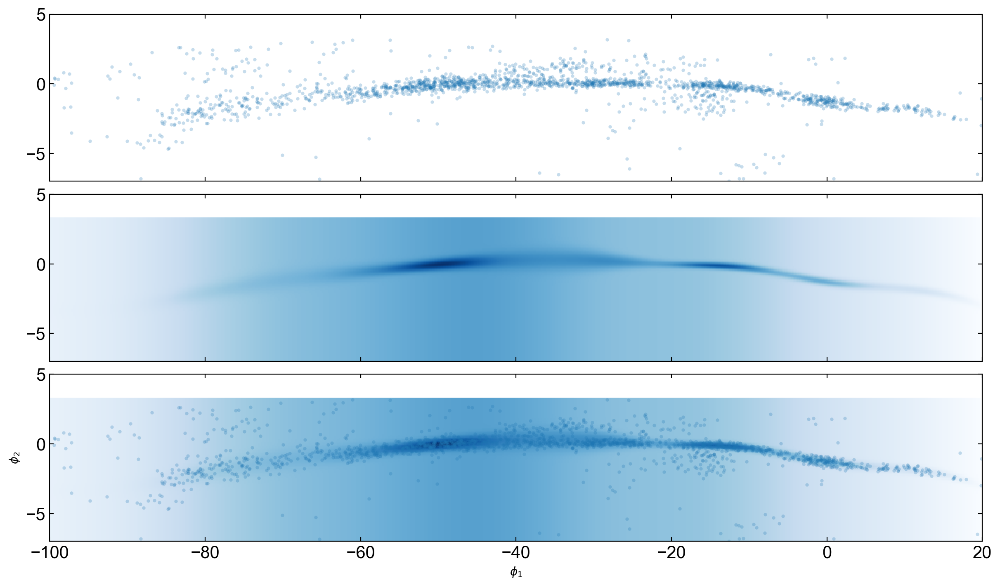

In [77]:
threshold = (final_memb_prob>0.99)

fig, axes = plt.subplots(3, 1, figsize=(12, 7), constrained_layout=True, sharex=True, sharey=True)
for ax in [axes[0], axes[2]]:
    ax.plot(
        run_data['phi1'][threshold],
        run_data['phi2'][threshold],
        marker="o",
        markeredgewidth=0,
        markersize=3.0,
        ls="none",
        alpha=0.25,
    )
    
for ax in [axes[1], axes[2]]:
    ax.pcolormesh(
        _grids[('phi1', 'phi2')][0],
        _grids[('phi1', 'phi2')][1],
        np.exp(ln_dens[('phi1', 'phi2')]),
        cmap="Blues",
        shading='auto'
    )
ax.set_xlim(-100, 20)
ax.set_ylim(-7, 5)

ax.set_xlabel(r"$\phi_1$")
ax.set_ylabel(r"$\phi_2$")

KeyError: 'phi1'

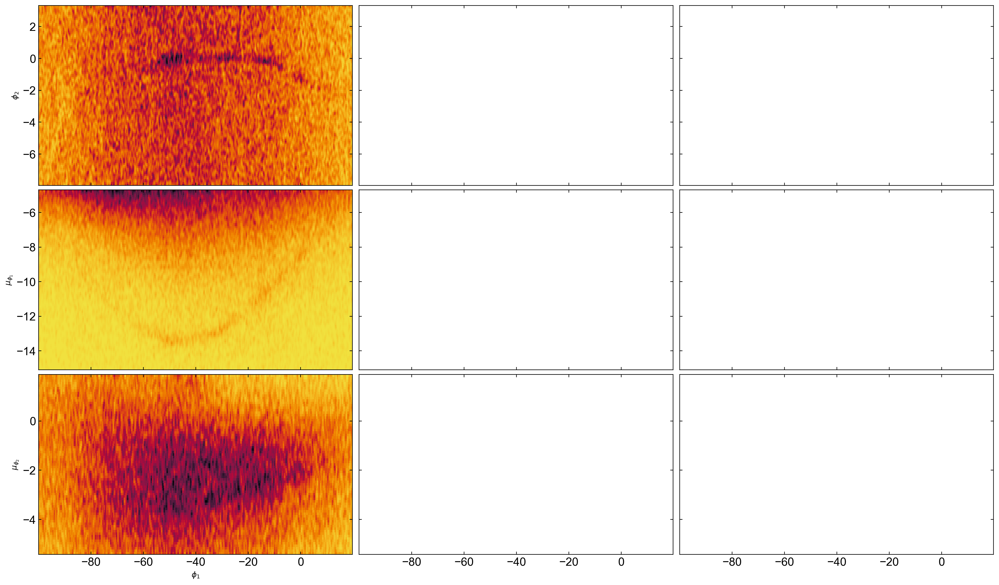

In [79]:
fig, axes = plt.subplots(
    len(full_mix_nobkg_opt.coord_names) - 1,
    3, 
    figsize=(18, 3.5 * (len(full_mix_nobkg_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=Base.default_grids,
    axes=axes[:, 0],
)
full_mix_nobkg_opt.plot_model_projections(axes=axes[:, 1])
full_mix_nobkg_opt.plot_residual_projections(
    data=run_data, axes=axes[:, 2], pcolormesh_kwargs=dict(vmin=-1, vmax=1)
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")

KeyError: 'phi1'

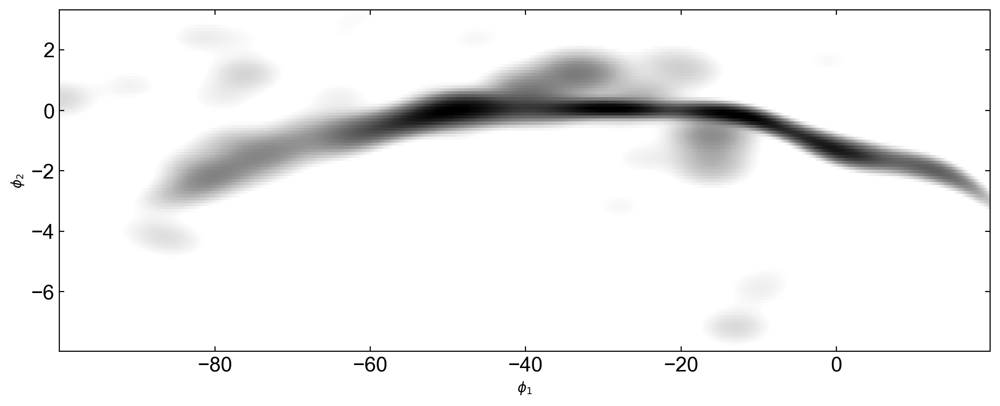

In [81]:
full_mix_nobkg_opt = StreamMixtureModel(
    full_mix_opt_pars, Components=[StreamDensModel, OffTrackModel], tied_params=tied_params
)
full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "phi2")], pcolormesh_kwargs=dict(norm=mpl.colors.LogNorm(vmin=1e-2, vmax=1), cmap='Greys')
)

full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "pm1")], pcolormesh_kwargs=dict(norm=mpl.colors.LogNorm(vmin=1e-2, vmax=1), cmap='Greys')
)

full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "pm2")], pcolormesh_kwargs=dict(norm=mpl.colors.LogNorm(vmin=1e-2, vmax=1), cmap='Greys')
)

In [82]:
full_mix_opt.spar_steps

AttributeError: 'StreamMixtureModel' object has no attribute 'spar_steps'

KeyError: 'phi1'

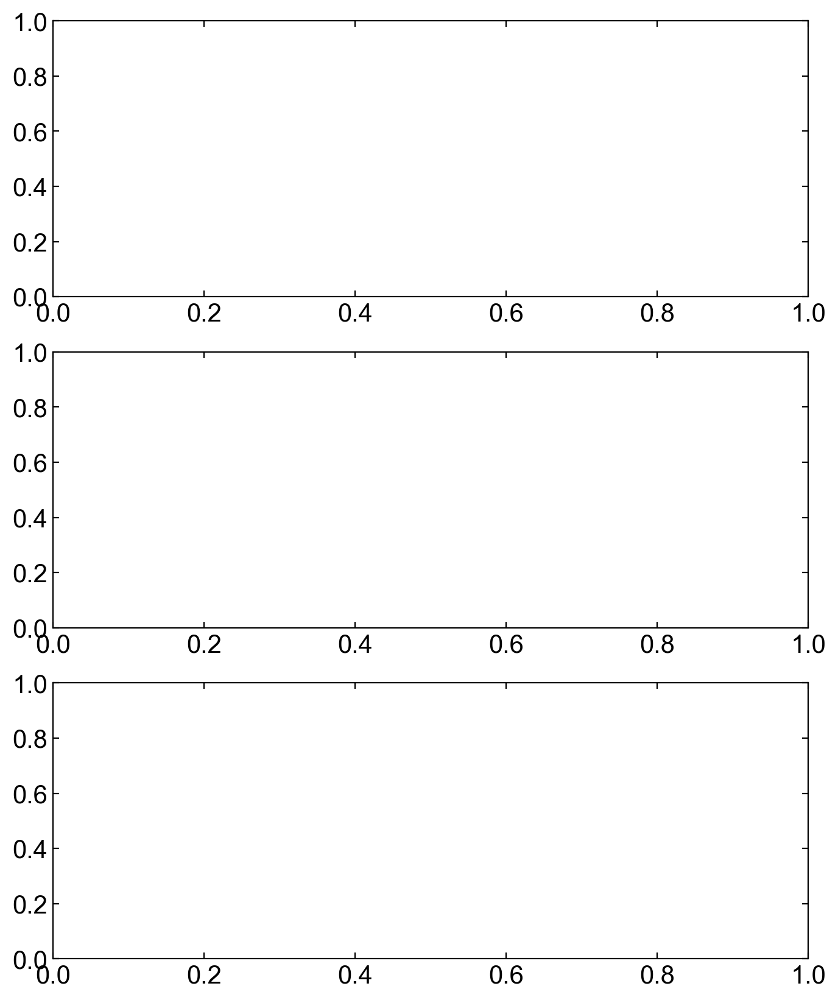

In [102]:
fig, axs = plt.subplots(3,1,figsize=(8,10))
full_mix_nobkg_opt.plot_model_projections(pcolormesh_kwargs=dict(vmin=0, vmax=0.5), axes=axs)

KeyError: 'phi1'

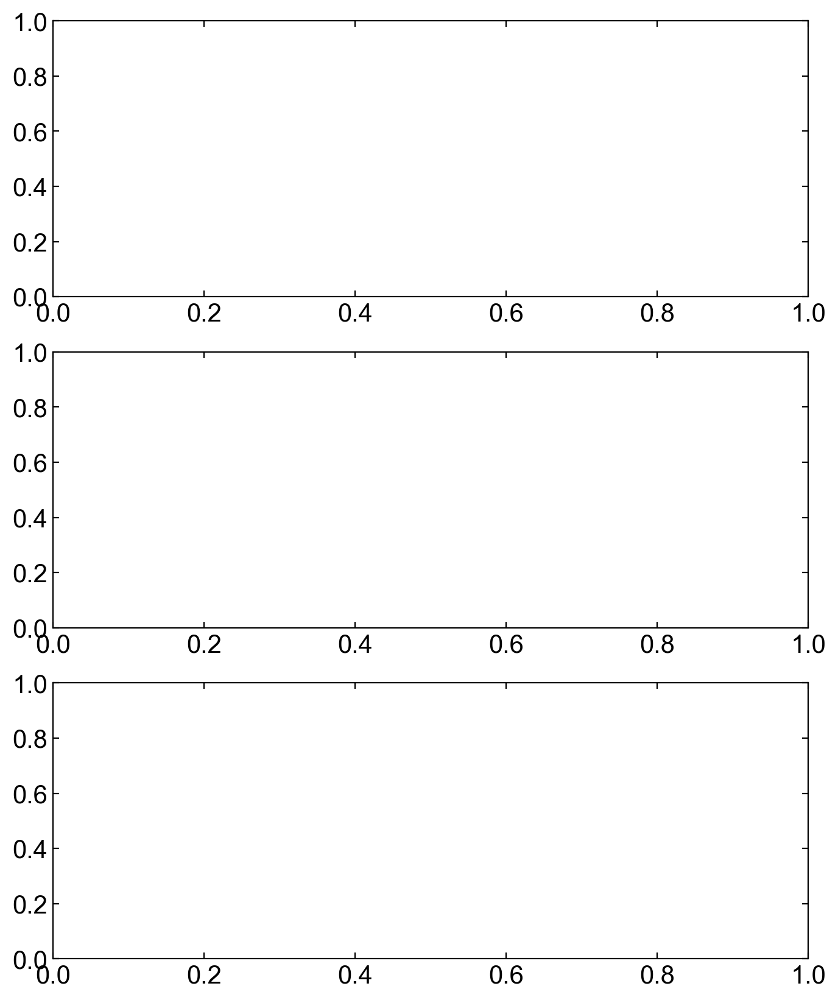

In [96]:
fig, axs = plt.subplots(3,1,figsize=(8,10))
full_mix_opt.plot_model_projections(pcolormesh_kwargs=dict(vmin=0, vmax=0.5), axes=axs)

TODO: how to plot projections for components where the x coord is in a joint, like OffTrack?

KeyError: 'phi1'

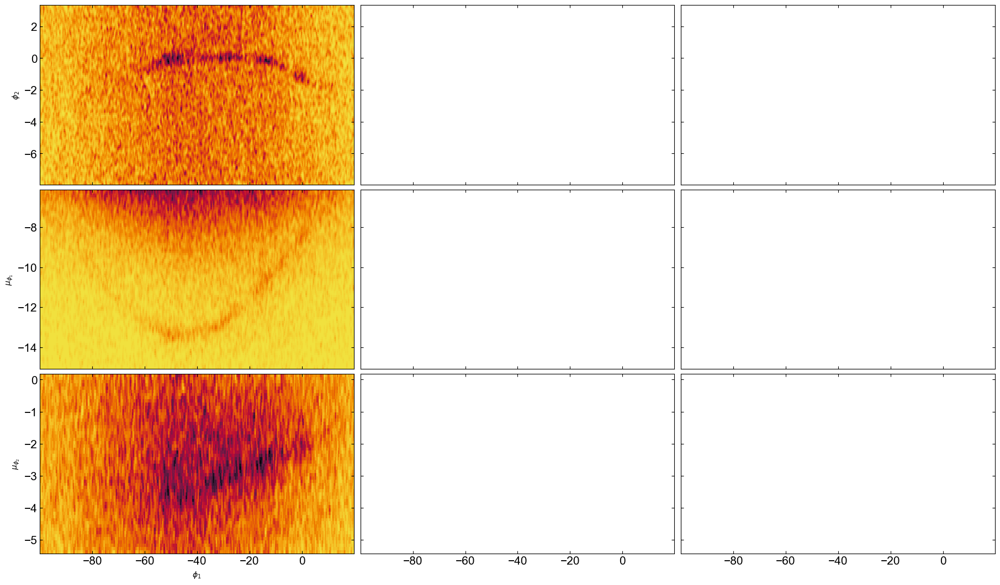

In [81]:
fig, axes = plt.subplots(
    len(stream_opt.coord_names) - 1,
    3, 
    figsize=(18, 3.5 * (len(stream_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)


axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=Base.default_grids,
    axes=axes[:, 0],
)
full_mix_opt1.plot_model_projections(axes=axes[:, 1])
full_mix_opt1.plot_residual_projections(
    data=run_data, axes=axes[:, 2], pcolormesh_kwargs=dict(vmin=-1, vmax=1)
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")